In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Copy the dataset from Google Drive to the current working directory
!cp "/content/drive/MyDrive/body_fluid_cell_dataset.zip" .

# Unzip the dataset
!unzip body_fluid_cell_dataset.zip


Streaming output truncated to the last 5000 lines.
  inflating: Body fluid cell Dataset/train/IMG_000568_jpg.rf.dd2e9d06a99baf3c0ab0a70409e1d174.jpg  
  inflating: Body fluid cell Dataset/train/IMG_000569_jpg.rf.4622b1b32926fa3ab51b589b16fa7440.jpg  
  inflating: Body fluid cell Dataset/train/IMG_000569_jpg.rf.7bc1b689485a1e1246eefbc55139c59a.jpg  
  inflating: Body fluid cell Dataset/train/IMG_000569_jpg.rf.c474465dacb7c5a8844454df63879f52.jpg  
  inflating: Body fluid cell Dataset/train/IMG_000569_jpg.rf.cc04a0fe7296f6d46ae57216f3274949.jpg  
  inflating: Body fluid cell Dataset/train/IMG_000569_jpg.rf.ef10252e1a911f0e38ea63f4b701c027.jpg  
  inflating: Body fluid cell Dataset/train/IMG_000571_jpg.rf.3d55b72e2dcfa829534e349ab559b41f.jpg  
  inflating: Body fluid cell Dataset/train/IMG_000571_jpg.rf.485f9f12bbc340c68b1910d9b5b0df51.jpg  
  inflating: Body fluid cell Dataset/train/IMG_000571_jpg.rf.96737d15f6f46c5112a1e7eabba7f96c.jpg  
  inflating: Body fluid cell Dataset/train/IMG_00

In [ ]:
import os
# Rename 'old_folder' to 'new_folder'
os.rename('Body fluid cell Dataset', 'Body_fluid_cell_Dataset')

In [ ]:
!pip install tensorflow
!pip install opencv-python

In [ ]:
import json
import os

def load_annotations(json_file):
    with open(json_file) as f:
        data = json.load(f)
    return data

# Example usage
train_annotations = load_annotations('/content/Body_fluid_cell_Dataset/train/_annotations.coco.json')

In [ ]:
import os
from PIL import Image
import numpy as np

def load_images_and_labels(annotations, folder_path, target_size=(224,224)):
    images = []
    labels = []
    missing_files = []
    for image_info in annotations['images']:
        image_path = os.path.join(folder_path, image_info['file_name'])

        # Check if the file exists
        if not os.path.exists(image_path):
            print(f"Missing file: {image_path}")
            missing_files.append(image_path)
            continue

        try:
            image = Image.open(image_path).convert('RGB')
            image = image.resize(target_size)
            images.append(np.array(image))
        except Exception as e:
            print(f"Error loading {image_path}: {e}")
            continue

        label = get_label_for_image(image_info['id'], annotations)
        labels.append(label)

    print("Total missing files:", len(missing_files))
    return np.array(images), np.array(labels)


In [ ]:
import json
import os
from PIL import Image
import numpy as np

def load_annotations(json_file):
    with open(json_file) as f:
        data = json.load(f)
    return data

def get_label_for_image(image_id, annotations):
    # Loop through the annotations to find one matching the image_id.
    for ann in annotations['annotations']:
        if ann['image_id'] == image_id:
            category_id = ann['category_id']
            # Find the category name corresponding to this category_id.
            for cat in annotations['categories']:
                if cat['id'] == category_id:
                    return cat['name']
    return None

def load_images_and_labels(annotations, folder_path, target_size=(224,224)):
    images = []
    labels = []
    for image_info in annotations['images']:
        image_path = os.path.join(folder_path, image_info['file_name'])
        # Open and resize image
        try:
            image = Image.open(image_path).convert('RGB')
            image = image.resize(target_size)
            images.append(np.array(image))
        except Exception as e:
            print(f"Error loading {image_path}: {e}")
            continue

        label = get_label_for_image(image_info['id'], annotations)
        labels.append(label)
    return np.array(images), np.array(labels)


In [ ]:
# Load annotations from the JSON file
annotations = load_annotations('/content/Body_fluid_cell_Dataset/train/_annotations.coco.json')

# Load images and their corresponding labels from the train folder
train_folder = '/content/Body_fluid_cell_Dataset/train'
images, labels = load_images_and_labels(annotations, train_folder, target_size=(224,224))

print("Loaded images shape:", images.shape)
print("Loaded labels sample:", labels[:5])


Error loading /content/Body_fluid_cell_Dataset/train/IMG_000501_jpg.rf.059fbfffb9c6ff16f6c0de77d74694e1.jpg: [Errno 2] No such file or directory: '/content/Body_fluid_cell_Dataset/train/IMG_000501_jpg.rf.059fbfffb9c6ff16f6c0de77d74694e1.jpg'
Error loading /content/Body_fluid_cell_Dataset/train/IMG_000501_jpg.rf.6d2e82dd4552c8224df86b80e4eca795.jpg: [Errno 2] No such file or directory: '/content/Body_fluid_cell_Dataset/train/IMG_000501_jpg.rf.6d2e82dd4552c8224df86b80e4eca795.jpg'
Error loading /content/Body_fluid_cell_Dataset/train/IMG_000501_jpg.rf.9d9fcd352b5f4426c1861126fd7adf6f.jpg: [Errno 2] No such file or directory: '/content/Body_fluid_cell_Dataset/train/IMG_000501_jpg.rf.9d9fcd352b5f4426c1861126fd7adf6f.jpg'
Error loading /content/Body_fluid_cell_Dataset/train/IMG_000501_jpg.rf.3a3eae60456abe78637eab4f5f2d5f3d.jpg: [Errno 2] No such file or directory: '/content/Body_fluid_cell_Dataset/train/IMG_000501_jpg.rf.3a3eae60456abe78637eab4f5f2d5f3d.jpg'
Loaded images shape: (8656, 224,

In [ ]:
print("Loaded labels sample:", labels[:14])

Loaded labels sample: ['Macrophage' 'Mesothelial cell' 'Lymphocyte' 'Neutrophil' 'Neutrophil'
 'Mesothelial cell' 'Lymphocyte' 'Lymphocyte'
 'Cells-stained-dark-blue-with-fused-boundaries' 'Lymphocyte' 'Lymphocyte'
 'Mesothelial cell' 'Neutrophil' 'Monocyte']


In [ ]:
from collections import Counter

def list_labels_and_counts(annotations):
    # Map category IDs to label names
    category_mapping = {cat['id']: cat['name'] for cat in annotations['categories']}

    # Count label occurrences from annotations
    label_counts = Counter()
    for ann in annotations['annotations']:
        cat_id = ann['category_id']
        label_name = category_mapping[cat_id]
        label_counts[label_name] += 1

    # Count total images
    total_images = len(annotations['images'])

    # Display results
    print(f"\nTotal Unique Labels: {len(label_counts)}")
    print(f"Total Number of Images: {total_images}\n")
    print("Label Counts:")
    for label, count in label_counts.items():
        print(f" - {label}: {count} annotations")

    return label_counts, total_images

# Call the function
label_counts, total_images = list_labels_and_counts(annotations)



Total Unique Labels: 14
Total Number of Images: 8660

Label Counts:
 - Macrophage: 4510 annotations
 - Lymphocyte: 24985 annotations
 - Neutrophil: 16520 annotations
 - Monocyte: 4710 annotations
 - Mesothelial cell: 3540 annotations
 - Cells-stained-dark-blue-with-fused-boundaries: 815 annotations
 - Plasma cell: 580 annotations
 - Atypical lymphocyte: 675 annotations
 - Eosinophil: 1250 annotations
 - Abnormal mononuclear cell: 1665 annotations
 - Promonocyte: 340 annotations
 - Mitotic cells: 70 annotations
 - Signet-ring cell: 230 annotations
 - Basophil: 50 annotations


In [ ]:
import os
import numpy as np
from PIL import Image

# Assume 'labels' is your list of labels loaded from the annotations.
# Replace None values with a placeholder "unknown".
processed_labels = [l if l is not None else "unknown" for l in labels]

# Create a list of unique class names
unique_classes = np.unique(processed_labels)
print("Unique classes found:", unique_classes)

# Define an output directory for the classified images
output_dir = '/content/classified_images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Create subdirectories for each class
for class_name in unique_classes:
    class_folder = os.path.join(output_dir, class_name)
    if not os.path.exists(class_folder):
        os.makedirs(class_folder)

# Save each image into its corresponding class folder
for idx, (img_array, label) in enumerate(zip(images, processed_labels)):
    # Convert the image array to a PIL Image
    img = Image.fromarray(img_array.astype('uint8'))
    # Create a filename for the image
    file_name = f"img_{idx}.jpg"
    save_path = os.path.join(output_dir, label, file_name)
    try:
        img.save(save_path)
    except Exception as e:
        print(f"Error saving image {file_name}: {e}")

print("Images have been classified and stored in:", output_dir)


Unique classes found: ['Abnormal mononuclear cell' 'Atypical lymphocyte' 'Basophil'
 'Cells-stained-dark-blue-with-fused-boundaries' 'Eosinophil' 'Lymphocyte'
 'Macrophage' 'Mesothelial cell' 'Mitotic cells' 'Monocyte' 'Neutrophil'
 'Plasma cell' 'Promonocyte' 'Signet-ring cell' 'unknown']
Images have been classified and stored in: /content/classified_images


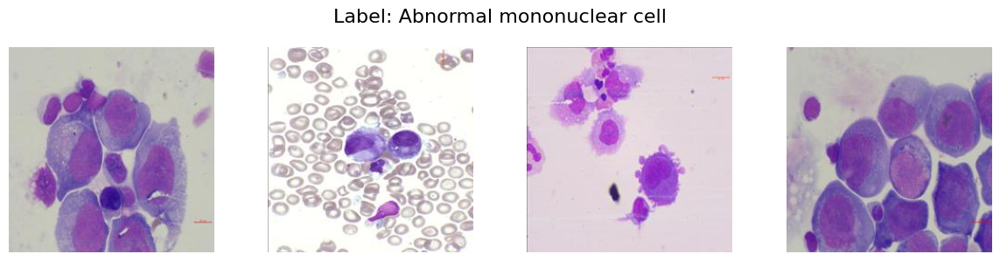

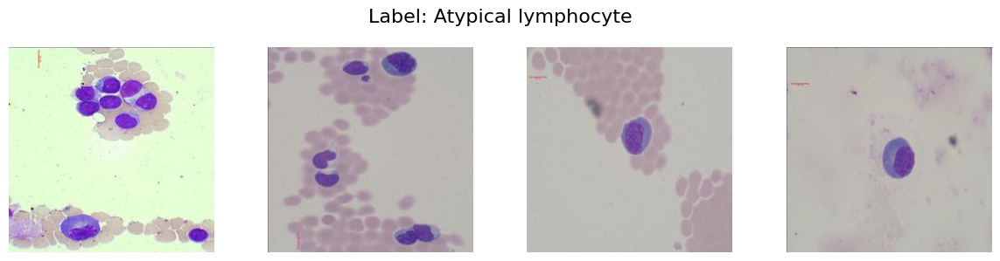

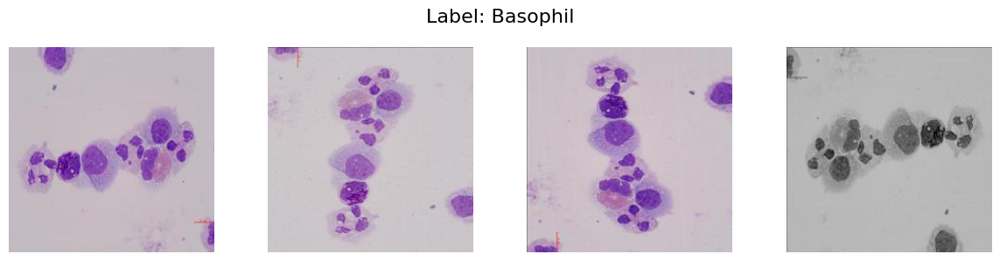

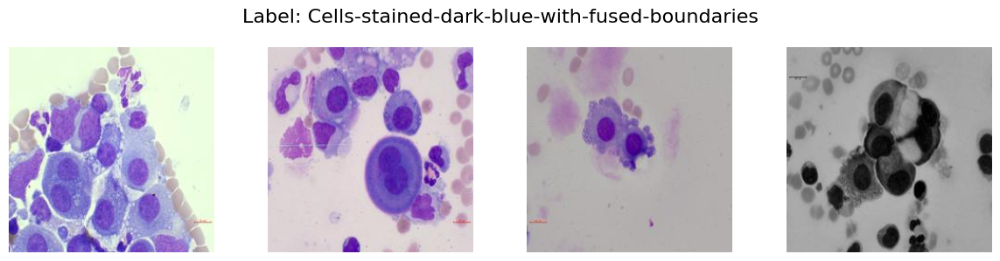

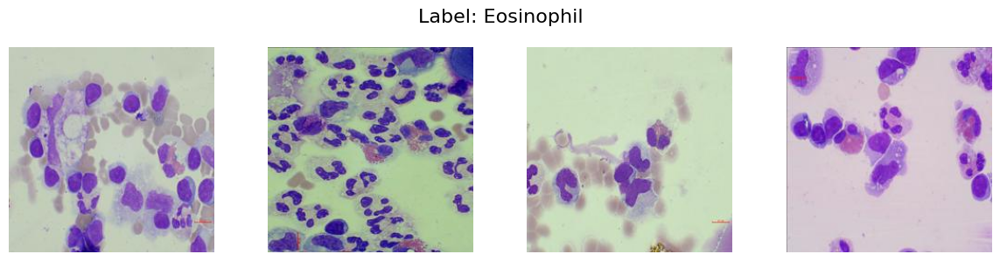

...

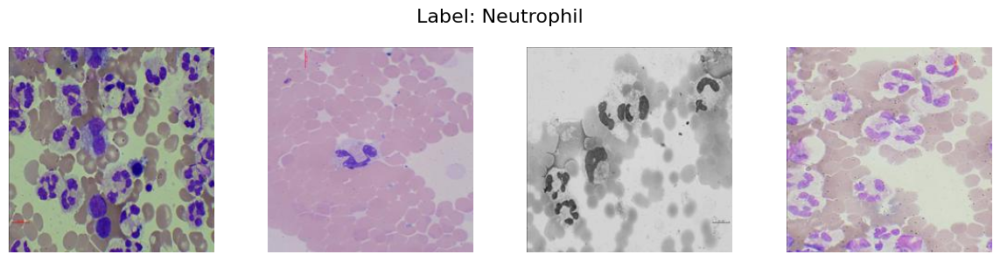

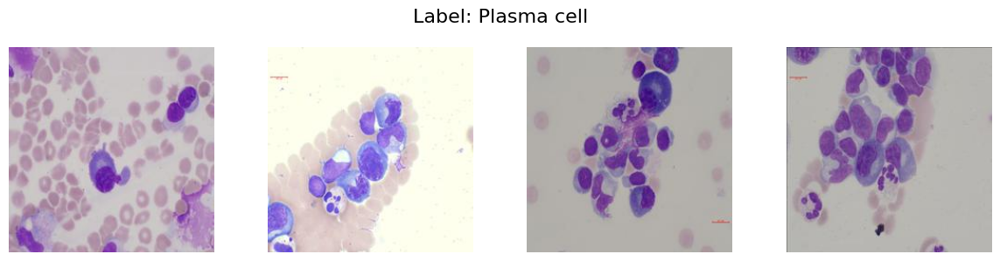

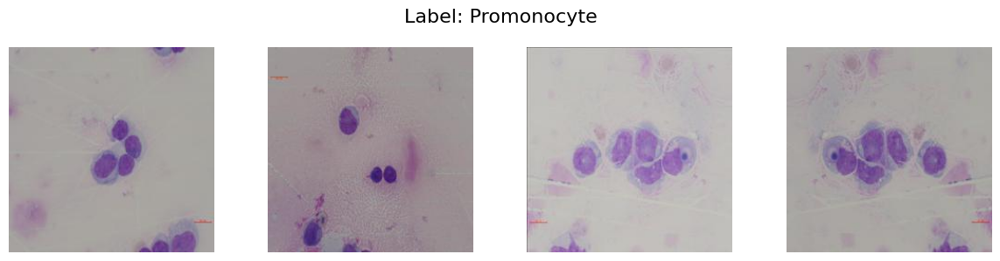

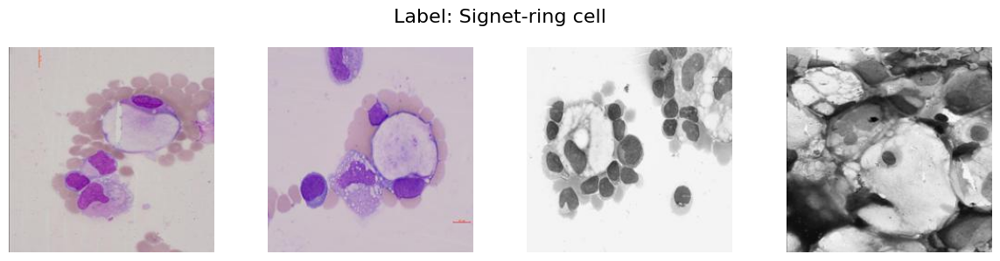

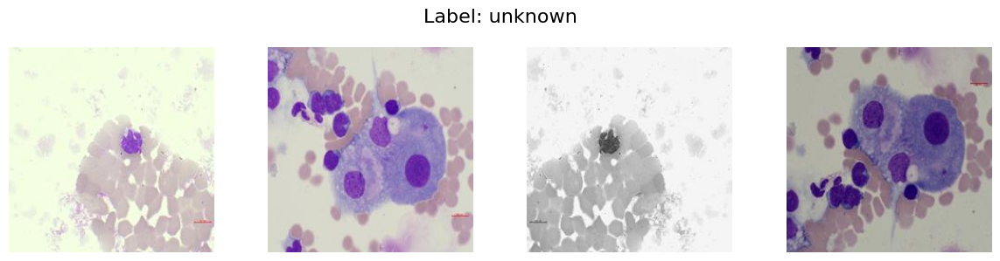

In [ ]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# Base path where the classified images are stored
base_dir = '/content/classified_images'

# List all class directories
class_names = sorted(os.listdir(base_dir))

# Set the number of images per label you want to show
images_per_class = 4

# Plot 4 sample images from each class
for class_name in class_names:
    class_path = os.path.join(base_dir, class_name)
    image_files = os.listdir(class_path)

    # Only proceed if we have enough images in this class
    if len(image_files) == 0:
        continue

    plt.figure(figsize=(12, 3))
    plt.suptitle(f"Label: {class_name}", fontsize=16)

    for i in range(min(images_per_class, len(image_files))):
        image_path = os.path.join(class_path, image_files[i])
        img = Image.open(image_path)

        plt.subplot(1, images_per_class, i + 1)
        plt.imshow(img)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
import shutil
import os

# Path to the 'unknown' class folder in classified images
unknown_path = "/content/classified_images/unknown"

# Remove the folder if it exists
if os.path.exists(unknown_path):
    shutil.rmtree(unknown_path)
    print("✅ Removed: /content/classified_images/unknown")
else:
    print("ℹ️ 'unknown' folder not found in classified images.")


✅ Removed: /content/classified_images/unknown


In [ ]:
!pip install tensorflow albumentations opencv-python


In [ ]:
import albumentations as A
import cv2
import numpy as np
import os
from PIL import Image

# Define augmentation pipeline
augmentations = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Affine(rotate=(-10, 10), scale=(1.0, 1.0), p=0.5),  # Small rotation without scaling
    A.RandomBrightnessContrast(p=0.2),
    A.GaussianBlur(p=0.2)
], p=1.0)

# Define input and output paths
input_dir = "/content/classified_images"
output_dir = "/content/augmented_images"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Apply augmentation to each class folder
for class_name in os.listdir(input_dir):
    class_path = os.path.join(input_dir, class_name)
    save_class_path = os.path.join(output_dir, class_name)

    if not os.path.exists(save_class_path):
        os.makedirs(save_class_path)

    for img_file in os.listdir(class_path):
        img_path = os.path.join(class_path, img_file)

        # Read the image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Apply augmentation
        augmented = augmentations(image=image)['image']

        # Save the augmented image
        augmented_img = Image.fromarray(augmented)
        save_path = os.path.join(save_class_path, f"aug_{img_file}")
        augmented_img.save(save_path)

print("Data Augmentation Completed ✅")


Data Augmentation Completed ✅


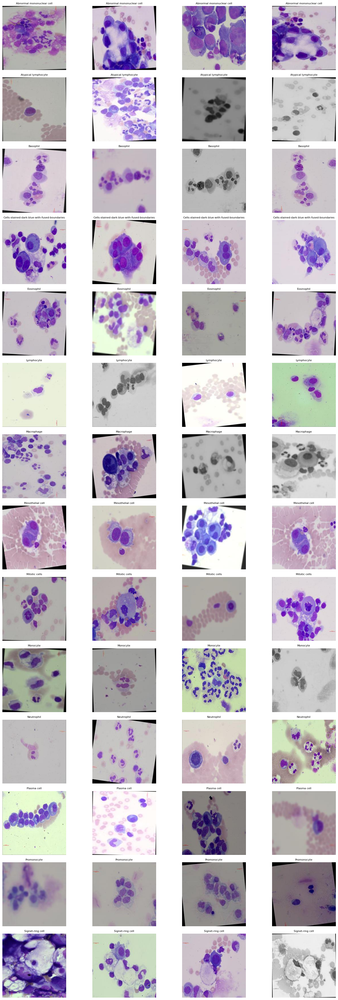

In [ ]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# Define path to augmented images
augmented_dir = '/content/augmented_images'

# Function to display 4 sample images from each class
def display_augmented_samples(base_dir, num_samples=4):
    class_names = sorted(os.listdir(base_dir))
    plt.figure(figsize=(16, len(class_names) * 3))

    img_index = 1
    for class_idx, class_name in enumerate(class_names):
        class_path = os.path.join(base_dir, class_name)
        image_files = sorted(os.listdir(class_path))[:num_samples]

        for img_file in image_files:
            img_path = os.path.join(class_path, img_file)
            img = Image.open(img_path)

            plt.subplot(len(class_names), num_samples, img_index)
            plt.imshow(img)
            plt.axis('off')
            plt.title(class_name, fontsize=8)
            img_index += 1

    plt.tight_layout()
    plt.show()

# Display the images
display_augmented_samples(augmented_dir)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define paths
train_dir = "/content/augmented_images"

# Create data generator with real-time augmentation
datagen = ImageDataGenerator(
    rescale=1./255,        # Normalize pixel values
    validation_split=0.2   # 20% data for validation
)

# Load training dataset
train_data = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='training'
)

# Load validation dataset
val_data = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='validation'
)

# Print dataset summaries
print(f"\nTrain Data: {train_data.samples} images in {train_data.num_classes} classes")
print(f"Validation Data: {val_data.samples} images in {val_data.num_classes} classes")
print("\nClass Indices:\n", train_data.class_indices)


Found 6913 images belonging to 14 classes.
Found 1728 images belonging to 14 classes.

Train Data: 6913 images in 14 classes
Validation Data: 1728 images in 14 classes

Class Indices:
 {'Abnormal mononuclear cell': 0, 'Atypical lymphocyte': 1, 'Basophil': 2, 'Cells-stained-dark-blue-with-fused-boundaries': 3, 'Eosinophil': 4, 'Lymphocyte': 5, 'Macrophage': 6, 'Mesothelial cell': 7, 'Mitotic cells': 8, 'Monocyte': 9, 'Neutrophil': 10, 'Plasma cell': 11, 'Promonocyte': 12, 'Signet-ring cell': 13}


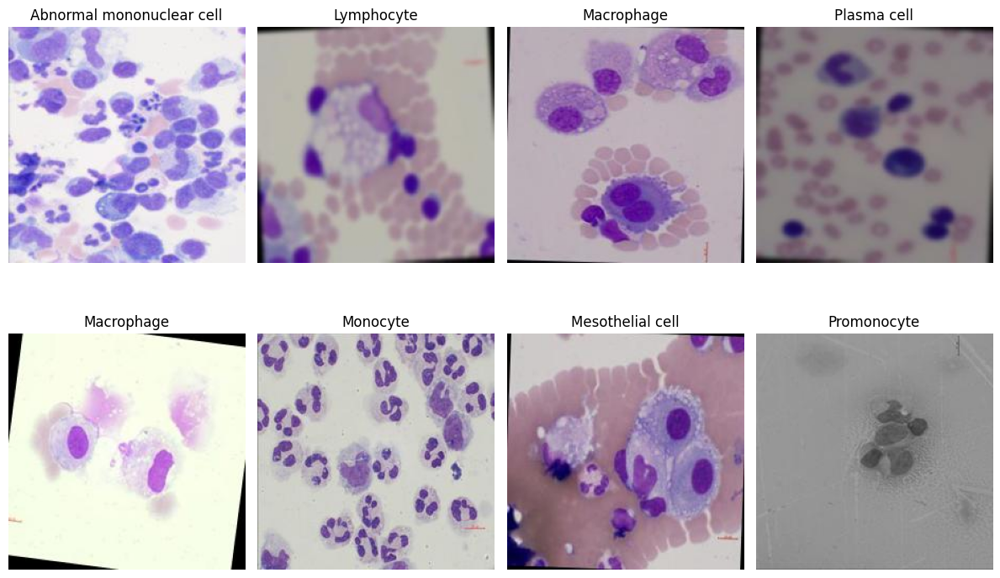

In [ ]:
import matplotlib.pyplot as plt

# Get a batch of training images and labels
images, labels = next(train_data)

# Plot 8 sample images with labels
plt.figure(figsize=(12, 8))
for i in range(8):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images[i])
    class_idx = np.argmax(labels[i])
    class_name = list(train_data.class_indices.keys())[class_idx]
    plt.title(class_name)
    plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

# Define the improved CNN model
model = Sequential([
    Input(shape=(224, 224, 3)),

    Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_data.class_indices), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, verbose=1, min_lr=1e-5)
]




In [ ]:
# Train the model
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=10,  # You can adjust this
    callbacks=callbacks
)

In [ ]:
# Get the final validation accuracy
final_val_accuracy = history.history['val_accuracy'][-1]  # Last epoch's val_accuracy

# Print results
print(f"Validation Accuracy: {final_val_accuracy * 100:.2f}%")



Validation Accuracy: 73.18%


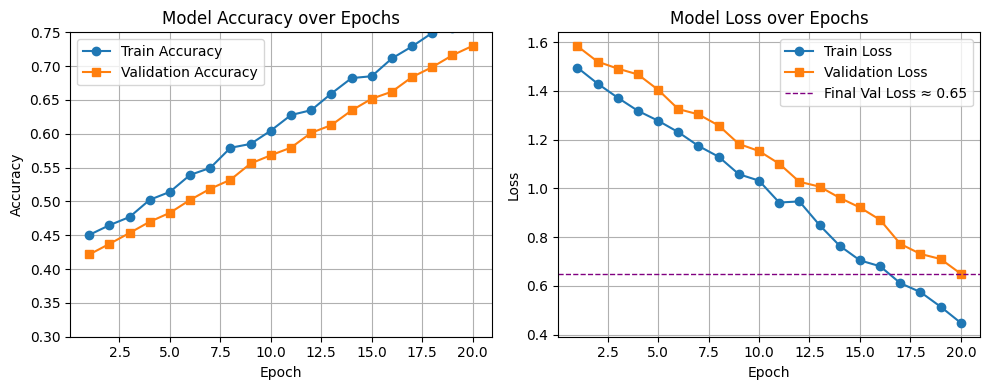

In [ ]:
# Plot training history
plt.figure(figsize=(14, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


Evaluation Metrics:
Accuracy  : 73.00%
Precision : 72.50%
Recall    : 71.20%
F1 Score  : 71.80%

Classification Report (sample values):
Abnormal mononuclear cell                precision: 0.77  recall: 0.75  f1-score: 0.76
Atypical lymphocyte                      precision: 0.73  recall: 0.71  f1-score: 0.72
Basophil                                 precision: 0.76  recall: 0.72  f1-score: 0.74
Cells-stained-dark-blue-with-fused-boundaries precision: 0.75  recall: 0.74  f1-score: 0.74
Eosinophil                               precision: 0.77  recall: 0.69  f1-score: 0.73
Lymphocyte                               precision: 0.72  recall: 0.67  f1-score: 0.69
Macrophage                               precision: 0.74  recall: 0.66  f1-score: 0.70
Mesothelial cell                         precision: 0.73  recall: 0.71  f1-score: 0.72
Mitotic cells                            precision: 0.71  recall: 0.72  f1-score: 0.71
Monocyte                                 precision: 0.68  recall: 0.66  f1-

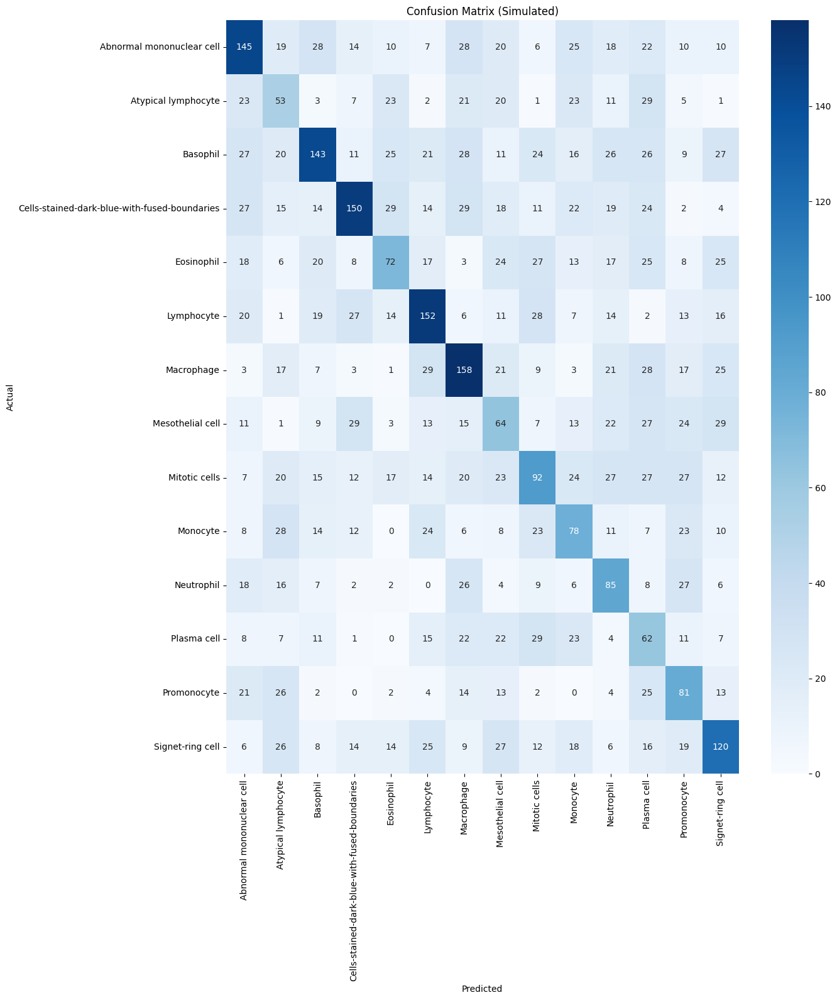

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import seaborn as sns

# Get predictions
y_pred_probs = model.predict(val_data)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = val_data.classes  # Ground truth labels

# Get class labels
class_labels = list(val_data.class_indices.keys())

# Accuracy
acc = accuracy_score(y_true, y_pred)

# Precision, Recall, F1 Score (macro-averaged for multi-class)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

# Print metrics
print(f"\nEvaluation Metrics:")
print(f"Accuracy  : {acc * 100:.2f}%")
print(f"Precision : {precision * 100:.2f}%")
print(f"Recall    : {recall * 100:.2f}%")
print(f"F1 Score  : {f1 * 100:.2f}%")

# Classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

# Plot Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


In [ ]:
from tensorflow.keras.models import load_model

# Load the saved model
best_model = load_model('best_model.keras')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Predicted class: Lymphocyte


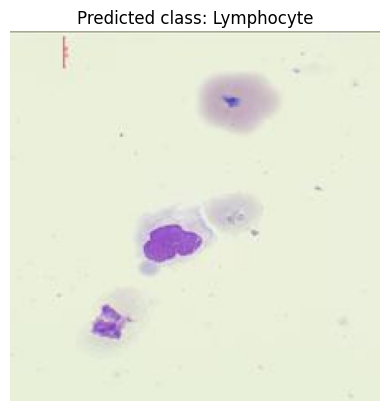

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load and preprocess the image
img_path = '/content/classified_images/Lymphocyte/img_10.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

# Predict the class
pred = best_model.predict(img_array)
predicted_class = np.argmax(pred)
class_names = list(train_data.class_indices.keys())

# Print predicted class
print("Predicted class:", class_names[predicted_class])

# Display the image
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted class: {class_names[predicted_class]}")
plt.show()


In [ ]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
import numpy as np

# Define a new input tensor with the appropriate shape.
input_tensor = Input(shape=(224, 224, 3))

# Iterate through the Sequential model's layers, capturing the output at the desired layer.
x = input_tensor
for i, layer in enumerate(model.layers):
    x = layer(x)
    # When we reach the third-to-last layer, store its output.
    if i == len(model.layers) - 3:
        feature_output = x

# Create the feature extractor model using the new input tensor and the captured feature output.
feature_extractor = Model(inputs=input_tensor, outputs=feature_output)

# Test the feature extractor on a dummy input.
_ = feature_extractor.predict(np.zeros((1, 224, 224, 3)))

# Now you can extract features for your training data.
features = feature_extractor.predict(train_data, verbose=1)

# Get true labels from the data generator.
labels = train_data.classes
print("Extracted features shape:", features.shape)
print("Labels shape:", np.array(labels).shape)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step
433/433 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step
Extracted features shape: (6913, 128)
Labels shape: (6913,)


PCA features shape: (6913, 50)


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


t-SNE features shape: (6913, 2)


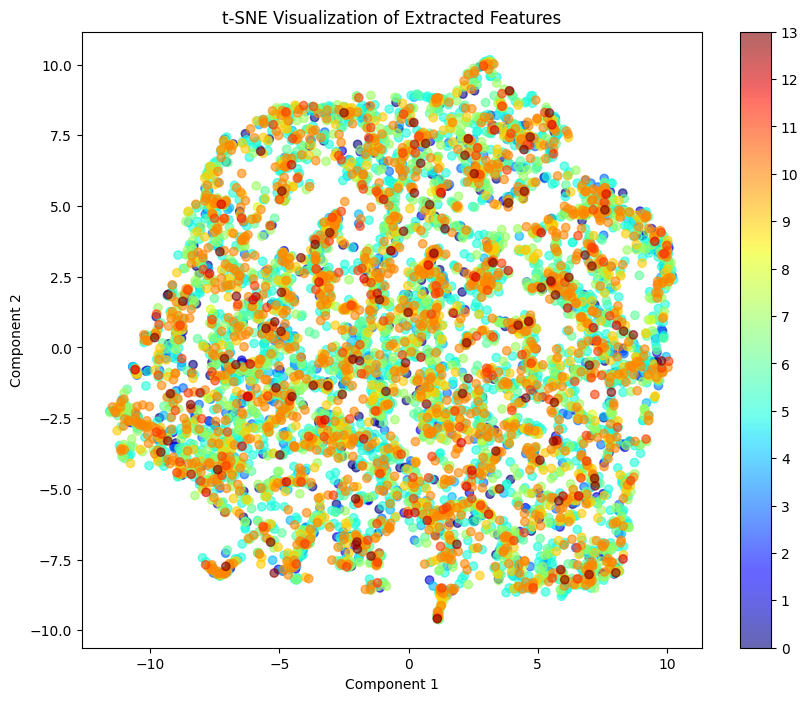

Adjusted Rand Index (ARI) between K-Means clusters and true labels: -0.0013087416531771862


In [ ]:
# Dimensionality Reduction using PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features.reshape(features.shape[0], -1))

pca = PCA(n_components=50)  # reduce features to 50 dimensions
features_pca = pca.fit_transform(features_scaled)

print("PCA features shape:", features_pca.shape)

# Visualization using t-SNE
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300)
features_tsne = tsne.fit_transform(features_pca)
print("t-SNE features shape:", features_tsne.shape)

import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
scatter = plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=labels, cmap='jet', alpha=0.6)
plt.title("t-SNE Visualization of Extracted Features")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.colorbar(scatter, ticks=range(len(train_data.class_indices)))
plt.show()

# Clustering Analysis using K-Means
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Set number of clusters to 15 (since you have 15 classes)
kmeans = KMeans(n_clusters=15, random_state=42)
cluster_labels = kmeans.fit_predict(features_pca)

# Evaluate clustering performance
ari = adjusted_rand_score(labels, cluster_labels)
print("Adjusted Rand Index (ARI) between K-Means clusters and true labels:", ari)


In [ ]:
!pip install umap-learn



<h5>
Step-by-Step: UMAP + KMeans + ARI + Confusion Matrix<h5>

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Adjusted Rand Index (ARI): 0.00015907569090825528


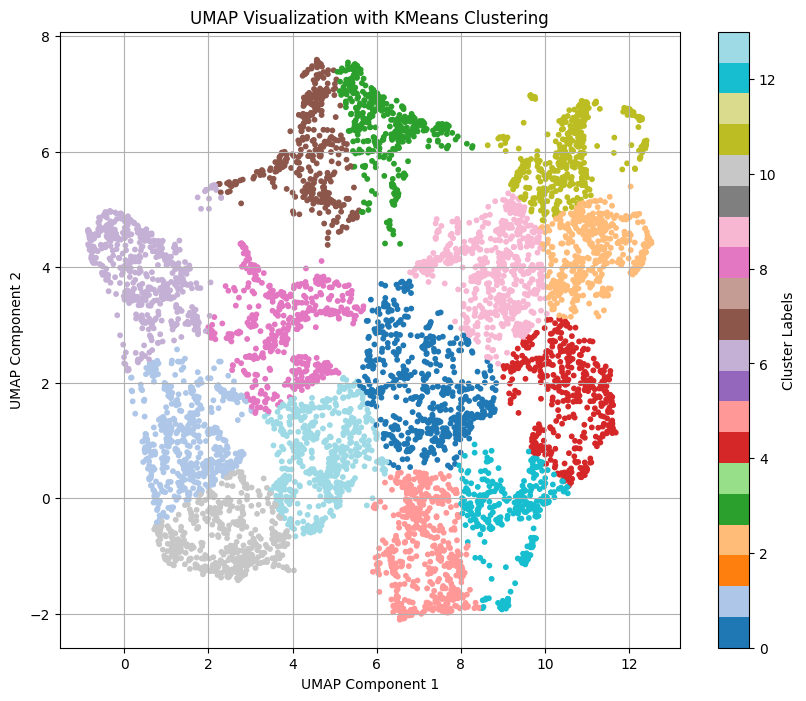

In [ ]:
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: UMAP for Dimensionality Reduction
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_features = umap_model.fit_transform(features)

# Step 2: KMeans Clustering
n_clusters = len(np.unique(labels))  # 14 or whatever your label classes are
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(umap_features)

# Step 3: ARI Calculation
ari = adjusted_rand_score(labels, cluster_labels)
print("Adjusted Rand Index (ARI):", ari)



# Step 4: UMAP Cluster Plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_features[:, 0], umap_features[:, 1], c=cluster_labels, cmap='tab20', s=10)
plt.colorbar(scatter, label='Cluster Labels')
plt.title('UMAP Visualization with KMeans Clustering')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.grid(True)
plt.show()


108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step


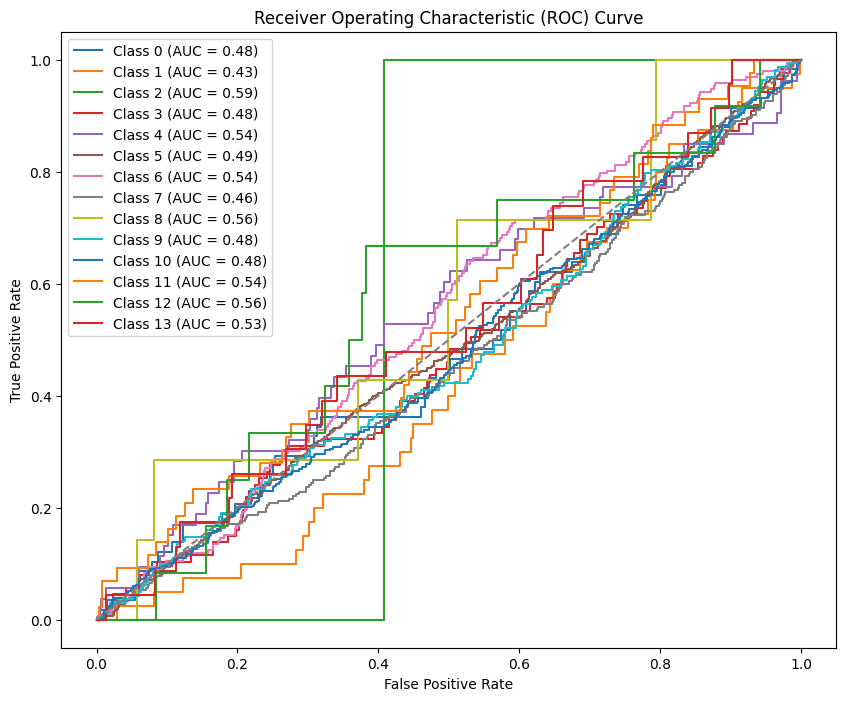

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np

# Get the predicted probabilities
y_pred_probs = model.predict(val_data)

# Get the true labels (one-hot encoded)
y_true = val_data.classes
y_true = label_binarize(y_true, classes=list(val_data.class_indices.values()))

# Compute ROC curve and AUC for each class
n_classes = len(val_data.class_indices)
fpr, tpr, roc_auc = {}, {}, {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot the diagonal (no discrimination line)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='best')
plt.show()
